## Geo
### visualisation for rental price growth rate for the next five years predicted by random forest

In [38]:
import geopandas as gpd
import json
import pandas as pd
with open('../data/curated/geo.json', 'r') as filename:
    geoJSON=json.load(filename)

In [59]:
dfrf = pd.read_csv('../data/curated/final_growing_rates_rf.csv')
dfxg = pd.read_csv('../data/curated/final_growing_rates_xgboost.csv')
dflr = pd.read_csv('../data/curated/final_growing_rates_lr.csv')

In [70]:
dfrf.head()
#dfrf[dfrf['Growth_Rate'] >= 0 ]['sign'] = 'positive'
#dfrf[dfrf['Growth_Rate'] < 0 ]['sign'] = 'negative'
d1 = dfrf[dfrf['Growth_Rate'] >= 0 ]
d1['sign'] = 'pos'
d2 = dfrf[dfrf['Growth_Rate'] < 0 ]
d2['sign'] = 'neg'
pd.concat([d1,d2])

<ipython-input-70-30430eee1b2c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d1['sign'] = 'pos'
<ipython-input-70-30430eee1b2c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  d2['sign'] = 'neg'


,Suburb_Name,sa2_2021,Growth_Rate,sign
0,Nhill Region,215011390,0.200466,pos
1,West Wimmera,215011393,0.197992,pos
2,Yarriambiack,215011394,0.197407,pos
3,Kerang,215031402,0.169350,pos
4,Rushworth,216011410,0.164419,pos
...,...,...,...,...
494,Box Hill North,207031164,-0.036016,neg
495,Lorne - Anglesea,203031049,-0.037958,neg
496,Moyne - West,217041478,-0.054437,neg
497,Bundoora - East,209011196,-0.070645,neg


In [73]:
import matplotlib as mpl
import pylab as plt

In [75]:
gdf

,FID,geometry
0,0,"POLYGON ((149.76065 -35.08347, 149.76795 -35.0..."
1,1,"POLYGON ((149.21921 -35.36010, 149.23878 -35.3..."
2,2,"POLYGON ((149.23149 -35.34224, 149.23155 -35.3..."
3,3,"POLYGON ((149.23155 -35.34221, 149.24149 -35.3..."
4,4,"POLYGON ((149.20647 -35.34586, 149.21921 -35.3..."
...,...,...
2463,2463,"POLYGON ((148.80030 -35.35975, 148.79873 -35.3..."
2466,2466,"POLYGON ((105.67393 -10.41566, 105.68604 -10.4..."
2467,2467,"MULTIPOLYGON (((96.84631 -12.07959, 96.84258 -..."
2468,2468,"POLYGON ((150.70196 -35.12302, 150.70847 -35.1..."


<ipython-input-76-c1a16c1f1c48>:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


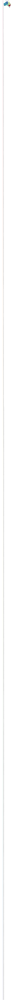

In [76]:
gdf = gpd.read_file('../data/raw/Geo/SIMP_SA2_2021_AUST_GDA2020/SA2_2021_AUST_GDA2020.shp')
gdf = gdf.dropna()
fig, ax = plt.subplots(1, figsize=(14,8))
geoJSON.plot(column='geometry', categorical=True, cmap='Spectral', linewidth=.6, edgecolor='0.2',
         legend=True, legend_kwds={'bbox_to_anchor':(.3, 1.05),'fontsize':16,'frameon':False}, ax=ax)
ax.axis('off')
ax.set_title('Land Usage in Rhodesia',fontsize=20)
plt.tight_layout()
#plt.savefig('images/rhodesia_land_classes.png',dpi=300)

In [ ]:

import folium
m = folium.Map(location=[-37.81, 144.96], tiles="Stamen Terrain", zoom_start=10, color='white')
svg_style = '<style>svg {background-color: rgb(255, 255, 255,0.5);}</style>'
m.get_root().header.add_child(folium.Element(svg_style))

c = folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
    data=dfrf.reset_index(), 
    columns=['Suburb_Name','Growth_Rate'],
    key_on='properties.SA2_NAME21', 
    fill_color='PiYG', 
    nan_fill_color='black',
    legend_name='growth rate per sa2 suburb',
)

c.add_to(m)
m

In [ ]:
path = '../plots/aggregated_geo/'
import os
if not os.path.exists(path):
    os.makedirs(path)
m.save(path +'growthrate_rf.html')

### visualisation for rental price growth rate for the next five years predicted by xgboost

In [79]:
import folium
m = folium.Map(location=[-37.81, 144.96], tiles="Stamen Terrain", zoom_start=10, color='white')
svg_style = '<style>svg {background-color: rgb(255, 255, 255,0.5);}</style>'
m.get_root().header.add_child(folium.Element(svg_style))

c = folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
    data=dfxg.reset_index(), 
    columns=['Suburb_Name','Growth_Rate'],
    key_on='properties.SA2_NAME21', 
    fill_color='PiYG', 
    nan_fill_color='black',
    legend_name='growth rate per sa2 suburb by xgboost',
)
c.geojson.add_child(
    folium.features.GeoJsonTooltip(['SA2_NAME21'], labels=True)
)
c.add_to(m)
m

* west vic suggested increasing trends in rental price growth rate
* east vic suggested decreasing trends in rental price growth rate


In [80]:
m.save(path +'growthrate_xg.html')

In [ ]:
import folium
m = folium.Map(location=[-37.81, 144.96], tiles="Stamen Terrain", zoom_start=10, color='white')
svg_style = '<style>svg {background-color: rgb(255, 255, 255,0.5);}</style>'
m.get_root().header.add_child(folium.Element(svg_style))

c = folium.Choropleth(
    geo_data=geoJSON,
    name='choropleth',
    data=dflr.reset_index(), 
    columns=['Suburb_Name','Growth_Rate'],
    key_on='properties.SA2_NAME21', 
    fill_color='PiYG', 
    nan_fill_color='black',
    legend_name='growth rate per sa2 suburb by linear regerssion',
)

c.add_to(m)
m

In [ ]:
m.save(path +'growthrate_lr.html')